In [ ]:
!pip install opendatasets

Import Dataset in Google colab

In [ ]:
import opendatasets as od
od.download("https://www.kaggle.com/datasets/gpiosenka/cards-image-datasetclassification/data")

#{"username":"ayhantan","key":"589e2a6702e67408b3a66abc2d2f11a5"}

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: ayhantan
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/gpiosenka/cards-image-datasetclassification


100%|██████████| 385M/385M [00:02<00:00, 156MB/s]


In [ ]:
import pandas as pd
data = pd.read_csv("/content/cards-image-datasetclassification/cards.csv")

In [ ]:
data.head()

,class index,filepaths,labels,card type,data set
0,0,train/ace of clubs/001.jpg,ace of clubs,ace,train
1,0,train/ace of clubs/002.jpg,ace of clubs,ace,train
2,0,train/ace of clubs/003.jpg,ace of clubs,ace,train
3,0,train/ace of clubs/004.jpg,ace of clubs,ace,train
4,0,train/ace of clubs/005.jpg,ace of clubs,ace,train


Load libraries

In [ ]:
import numpy as np
import pandas as pd
import os
import itertools
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

from sklearn.metrics import confusion_matrix , classification_report
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense,Dropout, BatchNormalization

import warnings
warnings.filterwarnings("ignore")

print("Load Models")

Load Models


Data Preprocessing

In [ ]:
class DataPreprocessing:

    def readData(path):
        filepaths = []
        labels = []

        folds = os.listdir(path)
        for fold in folds:
            foldpaths = os.path.join(path,fold)
            filelists = os.listdir(foldpaths)

            for file in filelists:
                filepath = os.path.join(foldpaths,file)

                filepaths.append(filepath)
                labels.append(fold)

        Fseries = pd.Series(filepaths, name="filepath")
        Lseries = pd.Series(labels, name="label")

        df = pd.concat([Fseries, Lseries], axis=1)

        return df

    def CreateImageDataGenerator(train_df, valid_df, test_df):
        image_size = (224, 224)
        batch_size = 20

        # Create an ImageDataGenerator for training with data augmentation
        train_gen = ImageDataGenerator(
            rotation_range=40,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2,
            horizontal_flip=True,
            fill_mode='nearest'
        ).flow_from_dataframe(train_df, x_col="filepath", y_col="label", color_mode='rgb',
                              class_mode="categorical", batch_size=batch_size, target_size=image_size)

        # Create an ImageDataGenerator for validation and test without augmentation
        valid_gen = ImageDataGenerator().flow_from_dataframe(valid_df, x_col="filepath", y_col="label", color_mode='rgb',
                                                              class_mode="categorical", batch_size=batch_size, target_size=image_size)

        test_gen = ImageDataGenerator().flow_from_dataframe(test_df, x_col="filepath", y_col="label", color_mode='rgb',
                                                             class_mode="categorical", batch_size=batch_size, target_size=image_size)

        return train_gen, valid_gen, test_gen


    def show_sample_of_data(data_gen):
        gen_dict = data_gen.class_indices
        classes_name = list(gen_dict.keys())

        images, labels = next(train_gen)


        plt.figure(figsize= (20, 20))

        for i in range(16):
            plt.subplot(4, 4, i + 1)
            image = images[i] / 255       # scales data to range (0 - 255)
            plt.imshow(image)
            index = np.argmax(labels[i])  # get image index
            class_name = classes_name[index]   # get class of image
            plt.title(class_name, color= 'blue', fontsize= 20)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

Read the data frame

In [ ]:
train_df = DataPreprocessing.readData("/content/cards-image-datasetclassification/train")
train_df.head()

,filepath,label
0,/content/cards-image-datasetclassification/tra...,four of clubs
1,/content/cards-image-datasetclassification/tra...,four of clubs
2,/content/cards-image-datasetclassification/tra...,four of clubs
3,/content/cards-image-datasetclassification/tra...,four of clubs
4,/content/cards-image-datasetclassification/tra...,four of clubs


In [ ]:
valid_df = DataPreprocessing.readData("/content/cards-image-datasetclassification/valid")
valid_df.head()

,filepath,label
0,/content/cards-image-datasetclassification/val...,four of clubs
1,/content/cards-image-datasetclassification/val...,four of clubs
2,/content/cards-image-datasetclassification/val...,four of clubs
3,/content/cards-image-datasetclassification/val...,four of clubs
4,/content/cards-image-datasetclassification/val...,four of clubs


In [ ]:
test_df = DataPreprocessing.readData("/content/cards-image-datasetclassification/test")
test_df.head()

,filepath,label
0,/content/cards-image-datasetclassification/tes...,four of clubs
1,/content/cards-image-datasetclassification/tes...,four of clubs
2,/content/cards-image-datasetclassification/tes...,four of clubs
3,/content/cards-image-datasetclassification/tes...,four of clubs
4,/content/cards-image-datasetclassification/tes...,four of clubs


Create Image Data Generator

In [ ]:
train_gen, valid_gen, test_gen = DataPreprocessing.CreateImageDataGenerator(train_df,valid_df,test_df)

Found 7624 validated image filenames belonging to 53 classes.
Found 265 validated image filenames belonging to 53 classes.
Found 265 validated image filenames belonging to 53 classes.


Show Sample of data for train, valid, test datas

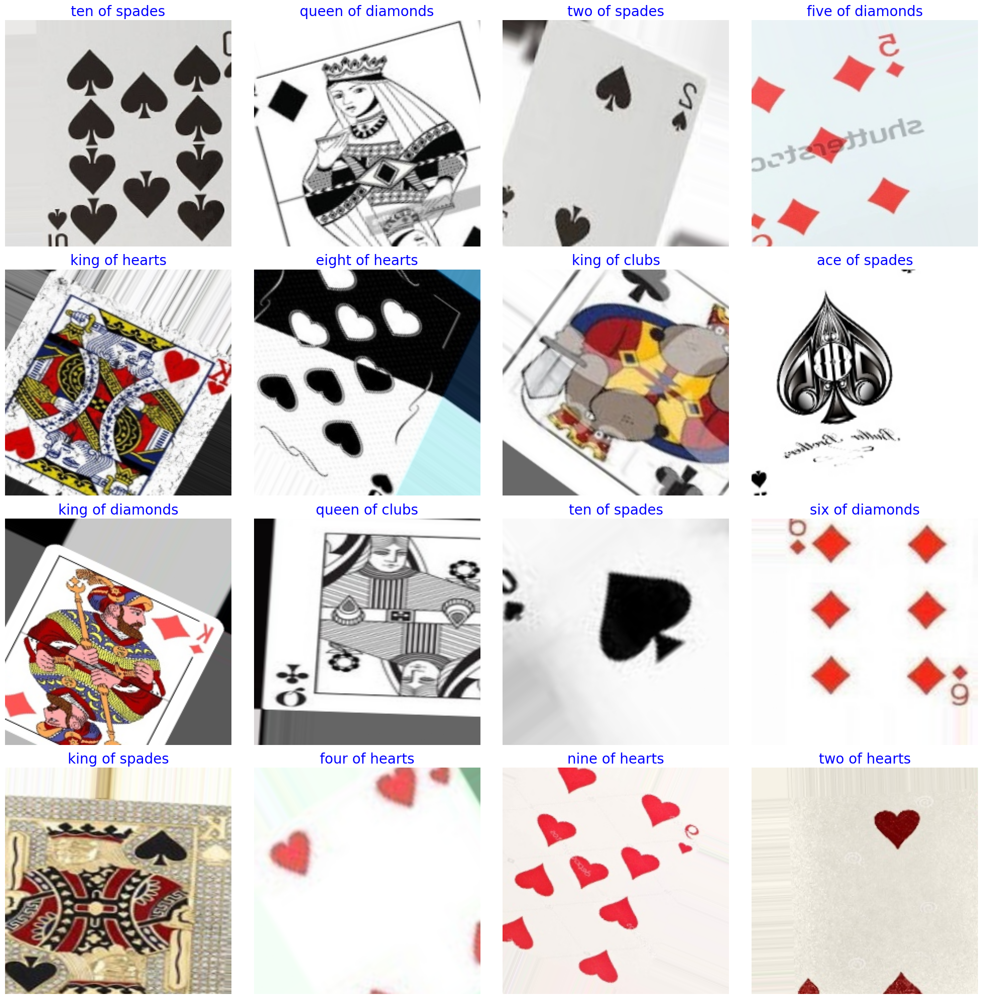

In [ ]:
#Show sample of train data
DataPreprocessing.show_sample_of_data(train_gen)

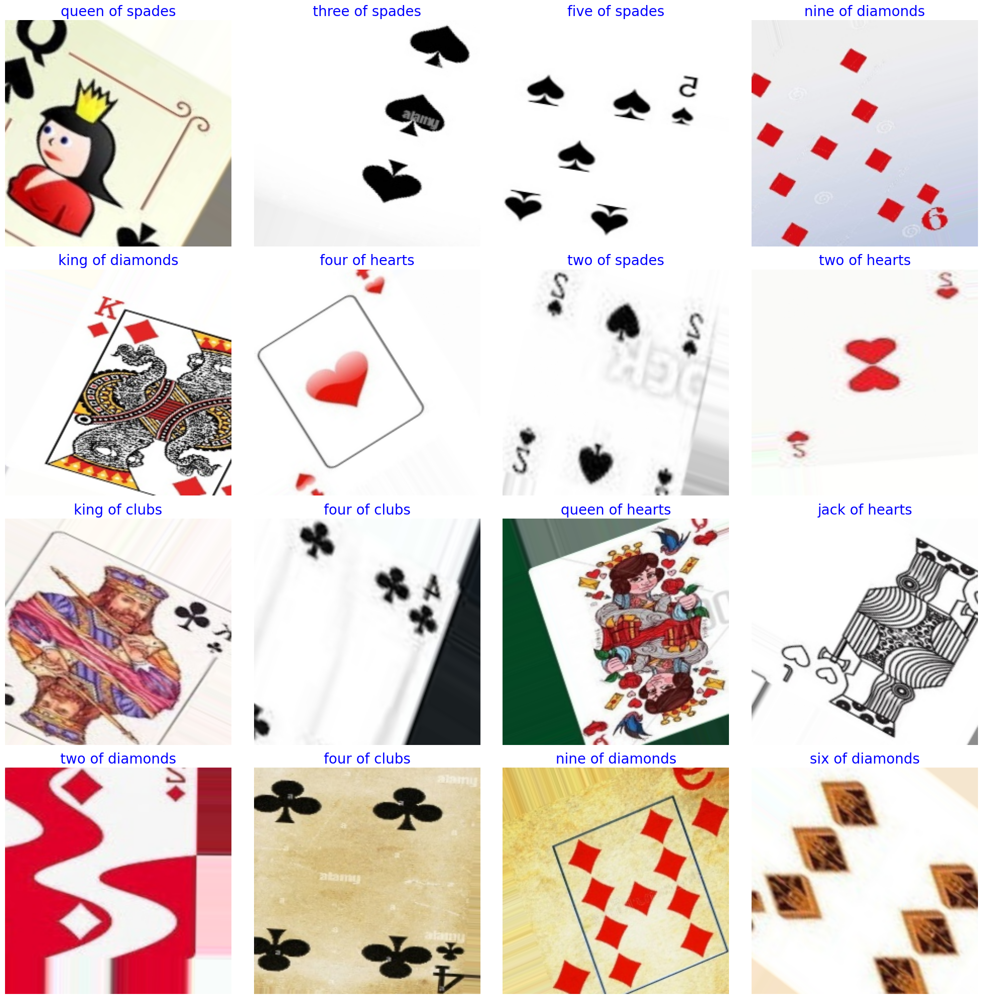

In [ ]:
#Show sample of valid data
DataPreprocessing.show_sample_of_data(valid_gen)

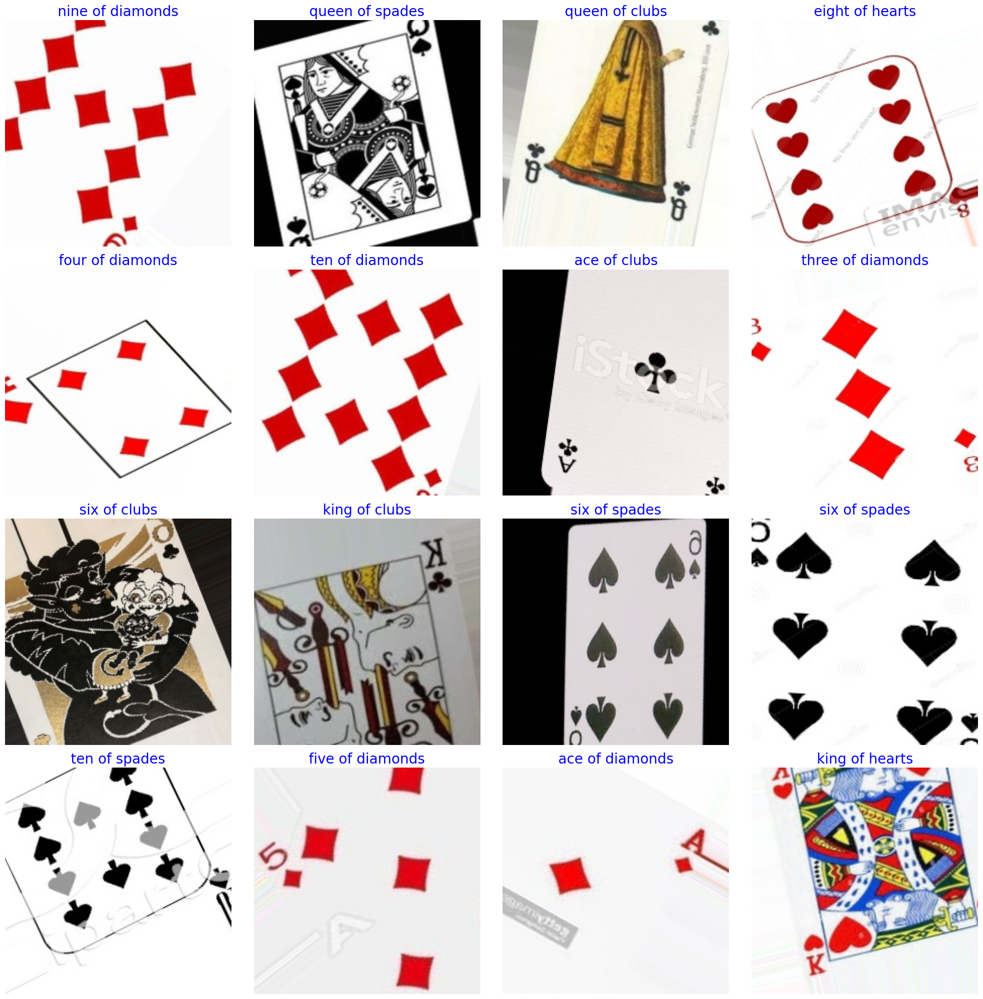

In [ ]:
#Show sample of test data
DataPreprocessing.show_sample_of_data(test_gen)

Fine tuning Pretrained Model

In [ ]:
channels = 3
image_size = (224,224)
image_shape =(image_size[0], image_size[1], channels)
class_count = len(list(train_gen.class_indices.keys()))

#efficentnetb7
base_model = keras.applications.EfficientNetB7(
    include_top=False,
    weights="imagenet",
    input_shape=image_shape,
)

base_model.trainable = True




"""#RestNet50
base_model = keras.applications.ResNet50(
    include_top=False,
    weights="imagenet",
    input_shape=image_shape,
)

base_model.trainable = False  # Set to True and fine-tune later if desired
"""
"""

#MobileNetV2
base_model = keras.applications.MobileNetV2(
    include_top=False,
    weights="imagenet",
    input_shape=image_shape,
)

base_model.trainable = False  # Or True if you want fine-tuning
"""



258076736/258076736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


'\n\n#MobileNetV2\nbase_model = keras.applications.MobileNetV2(\n    include_top=False,\n    weights="imagenet",\n    input_shape=image_shape,\n)\n\nbase_model.trainable = False  # Or True if you want fine-tuning\n'

In [ ]:
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 150

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

Number of layers in the base model:  814


In [ ]:
inputs = keras.Input(image_shape)
x = base_model(inputs)
x = Flatten()(x)
x = Dense(128, activation="relu")(x)
x = Dropout(rate=0.1, seed=123)(x)
x = Dense(64, activation="relu")(x)
x = Dropout(rate=0.2, seed=123)(x)
outputs = keras.layers.Dense(class_count,activation="softmax")(x)
model = keras.Model(inputs, outputs)

In [ ]:
model.compile(optimizer=Adamax(learning_rate=0.0001), loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb7 (Functional)     │ (None, 7, 7, 2560)     │    64,097,687 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 125440)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    16,056,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 53)             │         3,445 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 80,165,836 (305.81 MB)

 Trainable params: 79,610,041 (303.69 MB)

 Non-trainable params: 555,795 (2.12 MB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
#early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

#history = model.fit(
#    train_gen,
#    validation_data=valid_gen,
#    epochs=3,
#    steps_per_epoch=5,         # Only 5 batches per epoch
#    validation_steps=2,        # Only 2 batches for validation
#    callbacks=[early_stopping],
#    shuffle=True               # Recommended to prevent caching issues
#)


In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    train_gen,
    epochs=50,
    verbose=1,
    validation_data=valid_gen,
    callbacks=[early_stopping],
    shuffle=False
)


Epoch 1/50
 57/382 ━━━━━━━━━━━━━━━━━━━━ 2:41:35 30s/step - accuracy: 0.0136 - loss: 4.1403

In [ ]:
#Evalute model

# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]

Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()


In [ ]:
train_score = model.evaluate(train_gen, verbose= 1)
valid_score = model.evaluate(valid_gen, verbose= 1)
test_score = model.evaluate(test_gen, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)

print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
#get prediction
preds = model.predict(test_gen)
y_pred = np.argmax(preds, axis=1)

In [ ]:
model.save('model.h5')

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('model.h5')

In [ ]:
from tensorflow.keras.preprocessing import image

def predict_card(model, img_path):
    img = image.load_img(img_path, target_size=image_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array)
    class_idx = np.argmax(prediction)

    class_labels = list(train_gen.class_indices.keys())
    return class_labels[class_idx], prediction[0][class_idx]

# Example usage:
label, confidence = predict_card(model, 'geralt.jpg')
print(f"Detected: {label} with {confidence:.2f} confidence")

from IPython.display import Image, display
display(Image(filename='geralt.jpg'))
